# <center><u>Term deposit marketing compain</u></center>


## Business Problem

**Context:**

A fintech company is looking for ways to improve the success rate for calls made to customers for any product that its clients offer. Towards this goal, they are working on designing an ever evolving machine learning product that offers high success outcomes while offering interpretability for our clients to make informed decisions.

**Data Description:**

The data comes from direct marketing efforts of a European banking institution. The marketing campaign involves making a phone call to a customer, often multiple times, to ensure a product subscription, in this case a term deposit. Term deposits are usually short-term deposits with maturities ranging from one month to a few years. The customer must understand when buying a term deposit that they can withdraw their funds only after the term ends. All customer information that might reveal personal information is removed due to privacy concerns.

**Attributes:**

age : age of customer (numeric)

job : type of job (categorical)

marital : marital status (categorical)

education (categorical)

default: has credit in default? (binary)

balance: average yearly balance, in euros (numeric)

housing: has a housing loan? (binary)

loan: has personal loan? (binary)

contact: contact communication type (categorical)

day: last contact day of the month (numeric)

month: last contact month of year (categorical)

duration: last contact duration, in seconds (numeric)

campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)

**Output (desired target):**

y - has the client subscribed to a term deposit? (binary)

**Main goals**

The project should answer this main questions :
- Predict if the customer will subscribe (yes/no) to a term deposit (variable y)
- Hit %81 or above accuracy by evaluating with 5-fold cross validation and reporting the average performance score.
- We are also interested in finding customers who are more likely to buy the investment product. Determine the segment(s) of customers our client should prioritize.
- What makes the customers buy? Tell us which feature we should be focusing more on.



## Import necessary libraries 

In [2]:
# import main libraries
import pandas as pd
import seaborn as sns
import numpy as np
from numpy import mean, std


import matplotlib.pyplot as plt
from matplotlib import gridspec
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from sklearn.model_selection import (
    train_test_split,
    StratifiedKFold,
)
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.metrics import roc_curve, auc, roc_auc_score, make_scorer
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.model_selection import cross_val_score
from xgboost import XGBClassifier
from sklearn.feature_selection import RFE
from sklearn.linear_model import Perceptron
import pandas as pd
from pycaret.classification import (
    setup,
    compare_models,
    predict_model,
    evaluate_model,
    add_metric,
    get_metrics,
)
import warnings

warnings.filterwarnings("ignore")

# Data collection and explorartion


In [3]:
# Load the dataset
df_data = pd.read_csv("term-deposit-marketing-2020.csv")

In [4]:
# Display some rows first and last 5 rows of the dataset

pd.concat([df_data.head(), df_data.tail()])

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,no
39995,53,technician,married,tertiary,no,395,no,no,cellular,3,jun,107,1,no
39996,30,management,single,tertiary,no,3340,no,no,cellular,3,jun,238,3,yes
39997,54,admin,divorced,secondary,no,200,no,no,cellular,3,jun,170,1,yes
39998,34,management,married,tertiary,no,1047,no,no,cellular,3,jun,342,1,no
39999,38,technician,married,secondary,no,1442,yes,no,cellular,3,jun,113,1,no


In [5]:
# Dimensions of dataset (rows , columns)
df_data.shape

(40000, 14)

The dataset contains 126 observations, 6 independent variables (X) and 1 dependent variable (Y).


In [6]:
# Show dataset information,
df_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        40000 non-null  int64 
 1   job        40000 non-null  object
 2   marital    40000 non-null  object
 3   education  40000 non-null  object
 4   default    40000 non-null  object
 5   balance    40000 non-null  int64 
 6   housing    40000 non-null  object
 7   loan       40000 non-null  object
 8   contact    40000 non-null  object
 9   day        40000 non-null  int64 
 10  month      40000 non-null  object
 11  duration   40000 non-null  int64 
 12  campaign   40000 non-null  int64 
 13  y          40000 non-null  object
dtypes: int64(5), object(9)
memory usage: 4.3+ MB


We can see that there is no Null value


#### Check missing data


In [72]:
# Check missing data
print(
    "Number of cases with missing values: " + str(df_data.isnull().values.ravel().sum())
)

Number of cases with missing values: 0


There is no missing data


#### Check duplicate rows


In [73]:
df_data.duplicated().sum()

0

There are no duplicate rows in the dataset


In [74]:
# Diplay dataset decription
df_data.describe()

,age,balance,day,duration,campaign
count,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000
mean,40.544600,1274.277550,16.017225,254.824300,2.882175
std,9.641776,2903.769716,8.278127,259.366498,3.239051
min,19.000000,-8019.000000,1.000000,0.000000,1.000000
25%,33.000000,54.000000,8.000000,100.000000,1.000000
50%,39.000000,407.000000,17.000000,175.000000,2.000000
75%,48.000000,1319.000000,21.000000,313.000000,3.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000


# Exploratory Data Analysis(EDA)


### Exploration and Visualization

We try to find out the relative proportion of term deposit subscribers and non subsribers customers


Customers with term deposit: 2896
Customers without term deposit: 37104
Proportion of Customers with term deposit: 0.0724
Proportion of Customers without term deposit: 0.9276


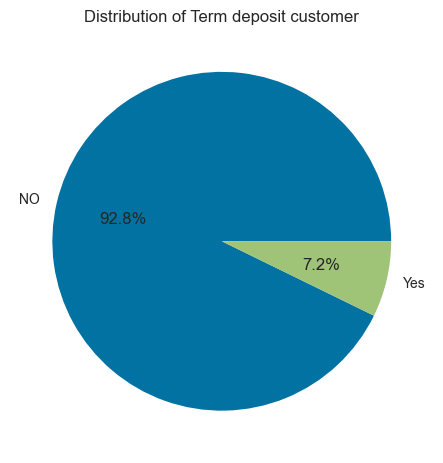

In [8]:
print("Customers with term deposit: " + str(len(df_data[df_data["y"] == 'yes'])))
print("Customers without term deposit: " + str(len(df_data[df_data["y"] == 'no'])))
print(
    "Proportion of Customers with term deposit: "
    + str(len(df_data[df_data["y"] == 'yes']) / df_data.shape[0])
)
print(
    "Proportion of Customers without term deposit: "
    + str(len(df_data[df_data["y"] == 'no']) / df_data.shape[0])
)

# To see the distribution of the target variable, we can use a pie chart 
cust_data_pi = df_data.copy()
cust_data_pi["Term deposit"] = np.where(cust_data_pi["y"] == 'yes', "Yes", "NO")

%matplotlib inline
cust_data_pi["Term deposit"].value_counts().plot(kind="pie", autopct="%1.1f%%")
plt.title("Distribution of Term deposit customer")
plt.ylabel("")
plt.show()

The dataset is imbalanced, with 93% of customers lacking a term deposit and 7% of customers subscribing to a term deposit. This implies that the company must exert additional effort to persuade a greater number of individuals to subscribe to the term deposit product, as a small number of consumers utilize this service.


## Bivariate analysis between features and target variables

### Count categorical variables


In [76]:
for cat_col in df_data.select_dtypes(include=["object"]).columns:
    print(f"====== {cat_col} =======")
    print(df_data[cat_col].value_counts())

====== job =======
job
blue-collar      9383
management       8166
technician       6852
admin            4483
services         3910
retired          1437
self-employed    1414
entrepreneur     1405
unemployed       1104
housemaid        1087
student           524
unknown           235
Name: count, dtype: int64
====== marital =======
marital
married     24386
single      10889
divorced     4725
Name: count, dtype: int64
====== education =======
education
secondary    20993
tertiary     11206
primary       6270
unknown       1531
Name: count, dtype: int64
====== default =======
default
no     39191
yes      809
Name: count, dtype: int64
====== housing =======
housing
yes    24031
no     15969
Name: count, dtype: int64
====== loan =======
loan
no     33070
yes     6930
Name: count, dtype: int64
====== contact =======
contact
cellular     24914
unknown      12765
telephone     2321
Name: count, dtype: int64
====== month =======
month
may    13532
jul     6380
aug     5215
jun     4734
nov

#### The 'unknown' value representation


In [77]:
# Function to calculate percentage of 'unknown' values in each column
def calculate_unknown_percentage(df):
    unknown_percentages = {}
    for column in df.columns:
        unknown_count = (df[column] == "unknown").sum()
        total_count = len(df[column])
        percentage = (unknown_count / total_count) * 100
        if unknown_count > 0:
            unknown_percentages[column] = f"{percentage.round(2)}%"
    return unknown_percentages


# Calculate and print the percentages
unknown_percentages = calculate_unknown_percentage(df_data)
print(unknown_percentages)

{'job': '0.59%', 'education': '3.83%', 'contact': '31.91%'}


Contact variable have a significant 'unknown' value representation 32%. But it should not impact our analysis since the other values ('cellular', 'telephone') are from the same family.


##### Extract categorical and numerical variables


In [78]:
categorical_columns = df_data.select_dtypes(include=["object"]).columns.tolist()
numerical_columns = df_data.select_dtypes(include=["number"]).columns.tolist()

print("Categorical columns:", categorical_columns)
print("Numerical columns:", numerical_columns)

Categorical columns: ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'y']
Numerical columns: ['age', 'balance', 'day', 'duration', 'campaign']


##### Convert month to numerical


In [79]:
# Convert month names to numerical values
df_data.insert(9, "month_num", pd.to_datetime(df_data["month"], format="%b").dt.month)
# add month_num to numerical columns list
numerical_columns.append("month_num")

#### Numerical features distribution

##### Using Histograms to visualize the distribution of numerical features

In [80]:
# Number of columns for subplots (2 per row)
cols = 1
# Number of rows needed
rows = (len(numerical_columns) + cols - 1) // cols

# Create subplots
fig = make_subplots(rows=rows, cols=cols, subplot_titles=numerical_columns)
# Define colors for the categories
colors = {"yes": "coral", "no": "cornflowerblue"}
# Add histograms to subplots
for i, column in enumerate(numerical_columns):
    row = i // cols + 1
    col = i % cols + 1

    # Create histogram for the numerical column separated by 'y'
    for category in df_data["y"].unique():
        histogram = go.Histogram(
            x=df_data[df_data["y"] == category][column],
            name=str(category),
            opacity=0.75,
            nbinsx=len(df_data[column].unique()),
            marker_color=colors[category],  # Set color based on category
            legendgroup="y",  # Group by 'y' for a single legend
            showlegend=(
                True if i == 0 else False
            ),  # Show legend only for the first subplot
        )
        fig.add_trace(histogram, row=row, col=col)

    fig.update_xaxes(title_text=column, row=row, col=col)
    fig.update_yaxes(title_text="Count", row=row, col=col)

# Update layout
fig.update_layout(
    height=rows * 400,
    width=1024,
    title_text="Distribution of Numerical Columns Related to y",
    barmode="overlay",  # or 'group' depending on your preference
    showlegend=True,
)

# Show the plot
fig.show()

##### Using Boxplot to visualize the distribution of numerical features

In [81]:
# Number of columns for subplots (2 per row)
cols = 2
# Number of rows needed
rows = (len(numerical_columns) + cols - 1) // cols

# Create subplots
fig = make_subplots(rows=rows, cols=cols, subplot_titles=numerical_columns)

# Add box plots to subplots
for i, column in enumerate(numerical_columns):
    row = i // cols + 1
    col = i % cols + 1

    box_plot = px.box(df_data, x="y", y=column, color="y")

    for trace in box_plot["data"]:
        fig.add_trace(trace, row=row, col=col)

    fig.update_xaxes(title_text="y", row=row, col=col)
    fig.update_yaxes(title_text=column, row=row, col=col)

# Update layout
fig.update_layout(
    height=rows * 400,
    width=1000,
    title_text="Distribution of Numerical Columns by y",
    showlegend=False,
)
fig.show()

##### Grouping age


In [82]:
# Grouping various age groups and placing them into bins for histogram

cut_labels = [
    "< 18",
    "18-27",
    "28-37",
    "38-47",
    "48-57",
    "58-67",
    "68-77",
    "78-87",
    "> 87",
]
cut_bins = [0, 17, 27, 37, 47, 57, 67, 77, 87, 100]
df_data["age_group"] = pd.cut(df_data["age"], bins=cut_bins, labels=cut_labels)

In [83]:
df_data["age_group"]

0        58-67
1        38-47
2        28-37
3        38-47
4        28-37
         ...  
39995    48-57
39996    28-37
39997    48-57
39998    28-37
39999    38-47
Name: age_group, Length: 40000, dtype: category
Categories (9, object): ['< 18' < '18-27' < '28-37' < '38-47' ... '58-67' < '68-77' < '78-87' < '> 87']

In [84]:
# Creating a dictionary to keep count of values falling under the age groups
dict_age = {}
for row in df_data["age_group"]:
    if row not in dict_age:
        print(row)
        dict_age[row] = 1
    else:
        dict_age[row] = dict_age[row] + 1

# Histogram to show number of values/individuals present in each age group
# It also shows that either there's a low life expectancy or the surveyed people didn't consist of old people much

fig = px.bar(
    x=list(dict_age.keys()),
    y=list(dict_age.values()),  # data from df columns
    title="Age Range",
    color=list(dict_age.keys()),
)
fig.update_xaxes(categoryorder="array", categoryarray=cut_labels)

fig.show()

58-67
38-47
28-37
48-57
18-27
78-87
68-77
> 87


The majority of people called during this marketing compain are the young and active ones between 28 to 57

#### Categorical features distribution

In [85]:
categorical_columns

['job',
 'marital',
 'education',
 'default',
 'housing',
 'loan',
 'contact',
 'month',
 'y']

##### Distrubution of categorical variables

In [87]:
# Number of rows needed
# categorical_columns_1 = categorical_columns.remove('month')
categorical_columns_1 = [
    value for value in categorical_columns if value not in ["month", "y"]
]
rows = (len(categorical_columns_1) + cols - 1) // cols

# Create subplots
fig = make_subplots(rows=rows, cols=cols, subplot_titles=categorical_columns_1)


# Add bar plots to subplots
for i, column in enumerate(categorical_columns_1):
    row = i // cols + 1
    col = i % cols + 1

    # Create bar plot for the categorical column separated by 'y'
    for category in df_data["y"].unique():
        bar_plot = go.Bar(
            x=df_data[df_data["y"] == category][column].value_counts().index,
            y=df_data[df_data["y"] == category][column].value_counts().values,
            name=str(category),
            opacity=0.75,
            marker_color=colors[category],  # Set color based on category
            legendgroup="y",  # Group by 'y' for a single legend
            showlegend=(
                True if i == 0 else False
            ),  # Show legend only for the first subplot
        )
        fig.add_trace(bar_plot, row=row, col=col)

    fig.update_xaxes(title_text=column, row=row, col=col)
    fig.update_yaxes(title_text="Count", row=row, col=col)

# Update layout
fig.update_layout(
    height=rows * 400,
    width=1024,
    title_text="Distribution of Categorical Columns Related to y",
    barmode="group",
    showlegend=True,
)

#### Handling categorical variables

##### Replace education (ordinal) with numerical values


In [89]:
# Educated sorted list
sorted_education = {"unknown": 0, "primary": 1, "secondary": 2, "tertiary": 3}
# Apply the mapping to the 'education' column
df_data["education"] = df_data["education"].map(sorted_education)

##### Replace 'yes' and 'no' with numerical values 1 and 0 respectively

In [90]:
yes_no_mapping = {"yes": 1, "no": 0}
yes_no_columns = ["default", "housing", "loan", "y"]
# Replace 'yes' with 1 and 'no' with 0
df_data[yes_no_columns] = df_data[yes_no_columns].replace(yes_no_mapping)

##### One hot encoding for other nominal categorical variables

In [91]:
df_data_final = pd.get_dummies(
    df_data, columns=["job", "marital", "contact"], drop_first=True, dtype="int"
)

##### Drop other columns that are not needed

In [92]:
df_data_final.drop(columns=["month", "age_group"], inplace=True)

In [93]:
df_data_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   age                40000 non-null  int64
 1   education          40000 non-null  int64
 2   default            40000 non-null  int64
 3   balance            40000 non-null  int64
 4   housing            40000 non-null  int64
 5   loan               40000 non-null  int64
 6   month_num          40000 non-null  int32
 7   day                40000 non-null  int64
 8   duration           40000 non-null  int64
 9   campaign           40000 non-null  int64
 10  y                  40000 non-null  int64
 11  job_blue-collar    40000 non-null  int32
 12  job_entrepreneur   40000 non-null  int32
 13  job_housemaid      40000 non-null  int32
 14  job_management     40000 non-null  int32
 15  job_retired        40000 non-null  int32
 16  job_self-employed  40000 non-null  int32
 17  job_services

#### Corellation matrix

In [95]:
# This corelation Graph shows the relationship of all variable in dataset to each other

numerical_columns_2 = df_data.select_dtypes(include=["number"]).columns.tolist()
corr = df_data[numerical_columns_2].corr()
corr.style.background_gradient(cmap="coolwarm")

,age,education,default,balance,housing,loan,month_num,day,duration,campaign,y
age,1.000000,-0.161471,-0.014857,0.081517,-0.179606,0.000041,0.095266,-0.011689,-0.036270,0.016204,-0.020273
education,-0.161471,1.000000,-0.007390,0.052765,-0.044800,0.005370,0.075412,0.032272,0.004813,0.006220,0.043828
default,-0.014857,-0.007390,1.000000,-0.070069,-0.019229,0.075006,0.024472,0.006287,-0.008597,0.012135,-0.006559
balance,0.081517,0.052765,-0.070069,1.000000,-0.049946,-0.080596,0.099736,0.011662,0.014072,-0.008137,0.030232
housing,-0.179606,-0.044800,-0.019229,-0.049946,1.000000,0.004266,-0.161402,-0.050622,0.022455,-0.054823,-0.054336
loan,0.000041,0.005370,0.075006,-0.080596,0.004266,1.000000,0.044699,0.005838,-0.003952,0.000582,-0.031029
month_num,0.095266,0.075412,0.024472,0.099736,-0.161402,0.044699,1.000000,0.142358,-0.021329,0.082301,-0.043784
day,-0.011689,0.032272,0.006287,0.011662,-0.050622,0.005838,0.142358,1.000000,-0.032983,0.165429,-0.006420
duration,-0.036270,0.004813,-0.008597,0.014072,0.022455,-0.003952,-0.021329,-0.032983,1.000000,-0.088387,0.461169
campaign,0.016204,0.006220,0.012135,-0.008137,-0.054823,0.000582,0.082301,0.165429,-0.088387,1.000000,-0.040350


The variable that is the most correlated to target varibale is "duration", which is logic since when the customer is interested by the product he will ask many questions, hence long duration time.


# Model building 

Initiate seed for reproducibility

In [96]:
import random


# set seed


seed = random.randint(1000, 9999)


print("Seed:", seed)

Seed: 9126


## Layer 1 : Model for selecting person to call

The first step is to create a model that will predict whether a person should be contacted based on his information. Since we have a huge dataset (40000), it is better and efficient to reduce the call number by extracting only customers that are likely to subscribe to the service.
For this, we need to extract only information related to the customer and exclude the information related to the call. The best model will have the highest recall score for **class 1**.

### Exctract non related call features

In [97]:
df_no_call = df_data_final.drop(["month_num", "day", "duration", "campaign"], axis=1)

### Split the data into features and target

In [98]:
# Move the 'y' column to the end
y_column = df_no_call.pop("y")
df_no_call["y"] = y_column


# Separate response and features
y = df_no_call["y"]
X = df_no_call.iloc[:, :21]

# Create a stratified split to maintain the class distribution
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)

# Preprocess the data
scaler = StandardScaler().set_output(transform="pandas")
X_scaled = scaler.fit_transform(X)
# split the data to train the final model
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.2, random_state=seed, stratify=y
)

In [99]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((32000, 21), (8000, 21), (32000,), (8000,))

In [100]:
y_train.value_counts()

y
0    29683
1     2317
Name: count, dtype: int64

### LazyPredict with imbalanced dataset

We will use autloml framework LazyClassifier to train the classifier model

In [101]:
from lazypredict import LazyClassifier
from sklearn.metrics import recall_score


# Define the custom scoring function
def recall_label_1(y_true, y_pred):
    return recall_score(y_true, y_pred, pos_label=1)


# Create a LazyClassifier instance
lc = LazyClassifier(verbose=0, custom_metric=recall_label_1)

# Fit the LazyClassifier instance
lc.fit(X_train, X_test, y_train, y_test)

# Run Lazy predict training
# lazy_clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
models, predictions = lc.fit(X_train, X_test, y_train, y_test)

 97%|█████████▋| 28/29 [04:19<00:14, 14.09s/it]

[LightGBM] [Info] Number of positive: 2317, number of negative: 29683
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004157 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 381
[LightGBM] [Info] Number of data points in the train set: 32000, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.072406 -> initscore=-2.550301
[LightGBM] [Info] Start training from score -2.550301


100%|██████████| 29/29 [04:20<00:00,  8.99s/it]


'tuple' object has no attribute '__name__'
Invalid Classifier(s)


 97%|█████████▋| 28/29 [03:37<00:12, 12.92s/it]

[LightGBM] [Info] Number of positive: 2317, number of negative: 29683
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004783 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 381
[LightGBM] [Info] Number of data points in the train set: 32000, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.072406 -> initscore=-2.550301
[LightGBM] [Info] Start training from score -2.550301


100%|██████████| 29/29 [03:38<00:00,  7.54s/it]


In [102]:
models

,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,recall_label_1,Time Taken
Model,,,,,,
NearestCentroid,0.60,0.59,0.59,0.70,0.58,0.09
DecisionTreeClassifier,0.86,0.53,0.53,0.87,0.15,0.27
ExtraTreeClassifier,0.87,0.53,0.53,0.87,0.13,0.12
ExtraTreesClassifier,0.90,0.53,0.53,0.89,0.10,4.87
BaggingClassifier,0.92,0.52,0.52,0.89,0.06,1.74
RandomForestClassifier,0.92,0.52,0.52,0.89,0.06,4.93
QuadraticDiscriminantAnalysis,0.88,0.52,0.52,0.87,0.10,0.13
GaussianNB,0.87,0.51,0.51,0.87,0.10,0.08
LabelPropagation,0.91,0.51,0.51,0.89,0.04,52.82


In [104]:
# Display the classification report for the best model in test set
lazy_NearestCentroid = lc.models["NearestCentroid"]
lazy_NearestCentroid.fit(X_train, y_train)


y_pred_1 = lazy_NearestCentroid.predict(X_test)


print(classification_report(y_test, y_pred_1))


print(confusion_matrix(y_test, y_pred_1))

              precision    recall  f1-score   support

           0       0.95      0.60      0.74      7421
           1       0.10      0.58      0.17       579

    accuracy                           0.60      8000
   macro avg       0.53      0.59      0.46      8000
weighted avg       0.89      0.60      0.70      8000

[[4470 2951]
 [ 241  338]]


In [106]:
# Display the classification report for the best model in train set
y_pred_train = lazy_NearestCentroid.predict(X_train)
print(classification_report(y_train, y_pred_train))


print(confusion_matrix(y_train, y_pred_train))

              precision    recall  f1-score   support

           0       0.95      0.60      0.73     29683
           1       0.10      0.60      0.18      2317

    accuracy                           0.60     32000
   macro avg       0.53      0.60      0.46     32000
weighted avg       0.89      0.60      0.69     32000

[[17753 11930]
 [  927  1390]]


After training lazypredict, we have obtained the following results:
- Best model for this case is NearestCentroid 
- We get a recall(1) score of 0.57 on the test set and 0.59 from the training set.

### LazyPredict with balanced dataset

#### Balance dataset with SMOTE for oversampling and RandomUnderSampler for undersampling

In [109]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
from collections import Counter

# summarize class distribution
counter = Counter(y)
print(counter)
# define pipeline
over = SMOTE(
    sampling_strategy=0.3, random_state=1
)  # sampling_strategy=0.1,random_state=1
under = RandomUnderSampler(sampling_strategy=0.5)
steps = [("o", over), ("u", under)]
pipeline = Pipeline(steps=steps)
# transform the dataset
Xb, yb = pipeline.fit_resample(X_scaled, y)
# summarize the new class distribution
counter = Counter(yb)
print(counter)

Counter({0: 37104, 1: 2896})
Counter({0: 22262, 1: 11131})


In [110]:
Xb.shape, yb.shape

((33393, 21), (33393,))

#### Split balanced dataset to train the final model

In [111]:
Xb_train, Xb_test, yb_train, yb_test = train_test_split(
    Xb, yb, test_size=0.2, random_state=seed, stratify=yb
)

#### Run lazypredict classification with balanced dataset

In [112]:
from lazypredict import LazyClassifier
from sklearn.metrics import recall_score
import pandas as pd


# Define the custom scoring function
def recall_label_1(y_true, y_pred):
    return recall_score(y_true, y_pred, pos_label=1)


# Create a LazyClassifier instance
lcb = LazyClassifier(verbose=0, custom_metric=recall_label_1)

# Fit the LazyClassifier instance
lcb.fit(Xb_train, Xb_test, yb_train, yb_test)

# Run Lazy predict training
# lazy_clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
modelsb, predictionsb = lcb.fit(Xb_train, Xb_test, yb_train, yb_test)

100%|██████████| 29/29 [05:49<00:00, 12.05s/it]


[LightGBM] [Info] Number of positive: 8905, number of negative: 17809
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001070 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1232
[LightGBM] [Info] Number of data points in the train set: 26714, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333346 -> initscore=-0.693091
[LightGBM] [Info] Start training from score -0.693091
'tuple' object has no attribute '__name__'
Invalid Classifier(s)


100%|██████████| 29/29 [06:35<00:00, 13.63s/it]

[LightGBM] [Info] Number of positive: 8905, number of negative: 17809
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001434 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1232
[LightGBM] [Info] Number of data points in the train set: 26714, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333346 -> initscore=-0.693091
[LightGBM] [Info] Start training from score -0.693091


In [116]:
modelsb.sort_values(by="recall_label_1", ascending=False)

,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,recall_label_1,Time Taken
Model,,,,,,
ExtraTreesClassifier,0.82,0.79,0.79,0.82,0.69,2.05
DecisionTreeClassifier,0.77,0.75,0.75,0.77,0.66,0.14
LGBMClassifier,0.88,0.83,0.83,0.88,0.66,0.17
RandomForestClassifier,0.83,0.78,0.78,0.82,0.65,2.33
KNeighborsClassifier,0.76,0.74,0.74,0.76,0.65,0.36
ExtraTreeClassifier,0.78,0.75,0.75,0.78,0.65,0.05
BaggingClassifier,0.83,0.79,0.79,0.83,0.64,0.80
NearestCentroid,0.60,0.59,0.59,0.61,0.59,0.08
LabelPropagation,0.77,0.72,0.72,0.76,0.58,43.92


The Best model for this case is ExtraTreesClassifier with recall(1) score of 0.7

In [117]:
lazy_dt = lc.models["ExtraTreesClassifier"]
# lazy_dt = DecisionTreeClassifier(max_depth=5)  # max_depth=5, min_samples_split
lazy_dt.fit(Xb_train, yb_train)
yb_pred_dt = lazy_dt.predict(Xb_test)
yb_pred_dt_train = lazy_dt.predict(Xb_train)
yb_pred_dt_train
print(classification_report(yb_test, yb_pred_dt))
print(confusion_matrix(yb_test, yb_pred_dt))

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      4453
           1       0.76      0.69      0.72      2226

    accuracy                           0.82      6679
   macro avg       0.80      0.79      0.80      6679
weighted avg       0.82      0.82      0.82      6679

[[3966  487]
 [ 694 1532]]


In [118]:
# Display the classification report for the best model in train and test set
y_pred_dt = lazy_dt.predict(X_test)
y_pred_dt_train = lazy_dt.predict(X_train)
y_pred_dt_train
print(classification_report(y_train, y_pred_dt_train))
print(confusion_matrix(y_train, y_pred_dt_train))

print(classification_report(y_test, y_pred_dt))
print(confusion_matrix(y_test, y_pred_dt))

              precision    recall  f1-score   support

           0       0.99      0.94      0.96     29683
           1       0.53      0.86      0.66      2317

    accuracy                           0.94     32000
   macro avg       0.76      0.90      0.81     32000
weighted avg       0.96      0.94      0.94     32000

[[27926  1757]
 [  313  2004]]
              precision    recall  f1-score   support

           0       0.99      0.93      0.96      7421
           1       0.50      0.88      0.64       579

    accuracy                           0.93      8000
   macro avg       0.75      0.91      0.80      8000
weighted avg       0.95      0.93      0.94      8000

[[6917  504]
 [  69  510]]


For balanced dataset, the best model for this case is ExtraTreesClassifier with recall(1) score of 0.73 for the test set and 0.87 for the training set. The confusion matrix shows that

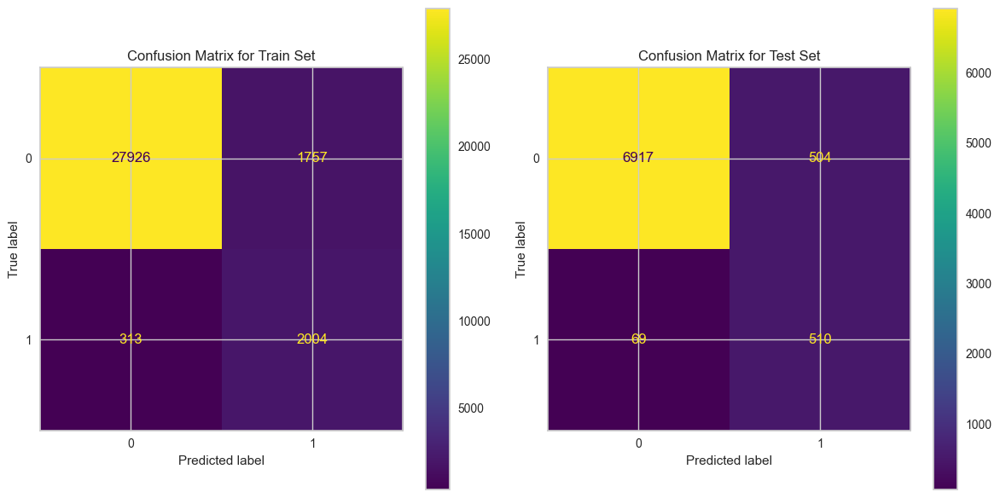

In [119]:
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay
import numpy as np

# Calculate confusion matrices
conf_matrix_train = confusion_matrix(y_train, y_pred_dt_train)
conf_matrix_test = confusion_matrix(y_test, y_pred_dt)

# Create a figure with two subplots
fig, axs = plt.subplots(1, 2, figsize=(12, 6), dpi=100)

# Plot confusion matrix for train set on the first subplot
display_train = ConfusionMatrixDisplay(
    conf_matrix_train, display_labels=lazy_dt.classes_
)
display_train.plot(ax=axs[0])
axs[0].set(title="Confusion Matrix for Train Set")

# Plot confusion matrix for test set on the second subplot
display_test = ConfusionMatrixDisplay(conf_matrix_test, display_labels=lazy_dt.classes_)
display_test.plot(ax=axs[1])
axs[1].set(title="Confusion Matrix for Test Set")

# Layout so plots do not overlap
fig.tight_layout()

# Show the plot
plt.show()

The total namber of person to contact is 2004 + 1757 + 510 + 504  = 4775 instead of 40000 

The model has missed 382 substribers which represents 382/2896 = 13%

#### Computing saving hours 

In [160]:
# Make predictions on the entire scaled dataset
y_pred_dt = lazy_dt.predict(X_scaled)

# Get the original values from the original DataFrame where prediction is 0
non_subscribers = df_no_call[y_pred_dt == 0]

In [161]:
# Extract the same rows from df_data_final using the index of df_no_call
non_subscribers_rows = df_data_final.loc[non_subscribers.index]

In [162]:
# Compute the total duration saved in hours
saved_hours = non_subscribers_rows.duration.sum() / 3600
saved_hours

2216.175

Using this approach we have save more than **2200** hours in call.

## Layer 2 : Model for predecting term deposit subscription

The Laye2 of the solution will focused on predicting the term deposit subscription usin the whole dataset. In this case wil will use **Precision 1** as the scoring metric since we need the model to be more relevant on the finding results.

### Data splitting

In [31]:
# Move the 'y' column to the end
y_column = df_data_final.pop("y")
df_data_final["y"] = y_column

In [34]:
# Splitting the X and Y into the


# Separate response and features
y = df_data_final["y"]
X = df_data_final.iloc[:, :25]

# Create a stratified split to maintain the class distribution
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)

# Preprocess the data
scaler = StandardScaler().set_output(transform="pandas")
X_scaled = scaler.fit_transform(X)
# split the data to train the final model
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.2, random_state=seed, stratify=y
)

In [35]:
print("Train size :", X_train.shape)
print("Test size :", X_test.shape)

Train size : (32000, 25)
Test size : (8000, 25)


### Function for evaluating  and display model metrics

In [37]:
import pandas as pd

# Global dataframe to store the metrics
global_df = pd.DataFrame(
    columns=[
        "Model",
        "Accuracy",
        "Precision",
        "Recall",
        "Precision_0",
        "Precision_1",
        "Recall_0",
        "Recall_1",
        "F1_Score",
    ]
)


def evaluate_model(model, model_name, to_fit=True):
    """






    Function to calculates and displays various machine learning metrics for a given model.







    Parameters:






    model (object): The trained machine learning model.






    model_name (str): The name of the model.
    """


    # Fit model

    if to_fit:

        model.fit(X_train, y_train)

    # Make predictions on the test data

    y_pred = model.predict(X_test)


    # Calculate the metrics

    accuracy = model.score(X_test, y_test)

    precision = precision_score(y_test, y_pred)

    recall = recall_score(y_test, y_pred)


    precision_0 = precision_score(y_test, y_pred, pos_label=0)

    precision_1 = precision_score(y_test, y_pred, pos_label=1)

    recall_0 = recall_score(y_test, y_pred, pos_label=0)

    recall_1 = recall_score(y_test, y_pred, pos_label=1)

    f1_score_v = f1_score(y_test, y_pred)


    # Print the metrics

    print(f"Model: {model_name}")


    print(f"Accuracy: {accuracy:.2f}")

    print(f"Precision: {precision:.2f}")

    print(f"Recall: {recall:.2f}")

    print(f"Precision (0): {precision_0:.2f}")

    print(f"Precision (1): {precision_1:.2f}")

    print(f"Recall (0): {recall_0:.2f}")

    print(f"Recall (1): {recall_1:.2f}")

    print(f"F1-Score: {f1_score_v:.2f}")


    # Check if the model name already exists in the dataframe


    if model_name in global_df["Model"].values:

        # Update the existing row

        global_df.loc[global_df["Model"] == model_name] = [
            model_name,

            accuracy,
            precision,
            recall,

            precision_0,
            precision_1,
            recall_0,
            recall_1,
            f1_score_v,
        ]

    else:

        # Add a new row to the dataframe

        global_df.loc[len(global_df)] = [
            model_name,

            accuracy,
            precision,
            recall,

            precision_0,
            precision_1,
            recall_0,
            recall_1,
            f1_score_v,
        ]

In [48]:
import plotly.graph_objs as go
import numpy as np


# Function to display the models in a bar chart for easy comparison
def display_models():
    # Create x-axis values
    x = np.arange(len(global_df["Model"]))
    width = 0.35  # This will be used for adjusting the positions

    # Create traces for Accuracy and Recall_0
    trace1 = go.Bar(
        x=x - width / 2,
        y=global_df["Accuracy"],
        width=width,
        name="Accuracy",
        marker=dict(color="cornflowerblue"),
    )

    trace2 = go.Bar(
        x=x + width / 2,
        y=global_df["Precision_1"],
        width=width,
        name="Precision_1",
        marker=dict(color="chocolate"),
    )

    # Create a horizontal line trace for the threshold
    threshold_line = go.Scatter(
        x=[-0.5, len(global_df["Model"]) - 0.5],
        y=[0.81, 0.81],
        mode="lines",
        line=dict(color="red", dash="dash"),
        name="Threshold (0.81)",
    )

    # Combine traces
    data = [trace1, trace2, threshold_line]

    # Create the layout
    layout = go.Layout(
        title="Model Performance Metrics",
        xaxis=dict(tickvals=x, ticktext=global_df["Model"], title="Model"),
        yaxis=dict(title="Value"),
        barmode="overlay",  # Use 'overlay' or 'group' for different styles
        legend=dict(
            x=1.05,  # Position to the right of the plot
            y=1,  # Align to the top
            orientation="v",  # Vertical legend
        ),
        margin=dict(b=160),  # Adjust margin to fit rotated labels
    )

    # Create the figure
    fig = go.Figure(data=data, layout=layout)

    # Rotate the x-axis labels for better readability
    fig.update_xaxes(tickangle=30)

    # Show the plot
    fig.show()

#### AutoML 

We will use different AutoML frameworks to compare different classification models, then chose the best model

##### Lazy Predict 

In [39]:
from lazypredict import LazyClassifier
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split

In [40]:
# scoring function
def precision_label_1(y_true, y_pred):
    precision = precision_score(y_true, y_pred, pos_label=1)
    # if np.isnan(precision):  # Handle NaN by returning 0
    #     return 0.0
    return precision


# Run Lazy predict training
lazy_clf = LazyClassifier(
    verbose=0, ignore_warnings=True, custom_metric=precision_label_1
)
models, predictions = lazy_clf.fit(X_train, X_test, y_train, y_test)
# Display models listed by LazyPredict sorted by F1 Score
models
# .sort_values(by="F1 Score", ascending=False)

  0%|          | 0/29 [00:00<?, ?it/s]

 97%|█████████▋| 28/29 [03:52<00:04,  4.65s/it]

[LightGBM] [Info] Number of positive: 2317, number of negative: 29683
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004582 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 722
[LightGBM] [Info] Number of data points in the train set: 32000, number of used features: 25
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.072406 -> initscore=-2.550301
[LightGBM] [Info] Start training from score -2.550301


100%|██████████| 29/29 [03:52<00:00,  8.02s/it]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,precision_label_1,Time Taken
Model,,,,,,
NearestCentroid,0.88,0.81,0.81,0.90,0.34,0.03
XGBClassifier,0.94,0.70,0.70,0.93,0.58,0.87
LGBMClassifier,0.94,0.70,0.70,0.93,0.59,0.43
DecisionTreeClassifier,0.92,0.69,0.69,0.92,0.42,0.37
LinearDiscriminantAnalysis,0.93,0.68,0.68,0.93,0.55,0.14
QuadraticDiscriminantAnalysis,0.90,0.68,0.68,0.91,0.35,0.08
GaussianNB,0.89,0.68,0.68,0.90,0.33,0.11
BaggingClassifier,0.93,0.66,0.66,0.92,0.56,2.16
LabelSpreading,0.92,0.65,0.65,0.91,0.42,100.51


In [42]:
models.sort_values(by="precision_label_1", ascending=False)

,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,precision_label_1,Time Taken
Model,,,,,,
SGDClassifier,0.93,0.53,0.53,0.90,0.65,0.43
SVC,0.93,0.57,0.57,0.91,0.63,21.79
ExtraTreesClassifier,0.93,0.61,0.61,0.92,0.62,4.38
RandomForestClassifier,0.94,0.64,0.64,0.92,0.62,5.31
LinearSVC,0.93,0.58,0.58,0.91,0.61,4.46
LogisticRegression,0.93,0.61,0.61,0.92,0.61,0.06
CalibratedClassifierCV,0.93,0.62,0.62,0.92,0.61,0.65
RidgeClassifier,0.93,0.55,0.55,0.91,0.60,0.17
RidgeClassifierCV,0.93,0.55,0.55,0.91,0.60,0.27


In [ ]:
# Run Lazy predict training
lazy_clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
models, predictions = lazy_clf.fit(X_train, X_test, y_train, y_test)
# Display models listed by LazyPredict sorted by F1 Score
models.sort_values(by="F1 Score", ascending=False)

In [43]:
# Sort the models based on accuracy and get the top 3
top_3_models = models.sort_values(by="precision_label_1", ascending=False).head(3)

# Print the top 3 models
print("Top 3 models based on accuracy:")
print(top_3_models)

# Retrieve the names of the top 3 models
top_3_model_names = top_3_models.index

# Retrieve the parameters of the top 3 models
top_3_model_params = {
    name: lazy_clf.models[name].get_params()["classifier"] for name in top_3_model_names
}

# Print the parameters of the top 3 models
for model_name, params in top_3_model_params.items():
    print(f"\nModel: {model_name}\nParameters: {params}")

Top 3 models based on accuracy:
                      Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                  
SGDClassifier             0.93               0.53     0.53      0.90   
SVC                       0.93               0.57     0.57      0.91   
ExtraTreesClassifier      0.93               0.61     0.61      0.92   

                      precision_label_1  Time Taken  
Model                                                
SGDClassifier                      0.65        0.43  
SVC                                0.63       21.79  
ExtraTreesClassifier               0.62        4.38  

Model: SGDClassifier
Parameters: SGDClassifier(random_state=42)

Model: SVC
Parameters: SVC(random_state=42)

Model: ExtraTreesClassifier
Parameters: ExtraTreesClassifier(random_state=42)


In [49]:
# top_3_model_params

lazy_SVC = lazy_clf.models["SVC"]
lazy_ExtraTreesClassifier = lazy_clf.models["ExtraTreesClassifier"]
lazy_SGDClassifier = lazy_clf.models["SGDClassifier"]

# Evaluate the new models
evaluate_model(lazy_SVC, "SVC_lazy")
evaluate_model(lazy_ExtraTreesClassifier, "ExtraTreesClassifier_lazy")
evaluate_model(lazy_SGDClassifier, "SGDClassifier_lazy")

Model: SVC_lazy
Accuracy: 0.93
Precision: 0.63
Recall: 0.15
Precision (0): 0.94
Precision (1): 0.63
Recall (0): 0.99
Recall (1): 0.15
F1-Score: 0.25
Model: ExtraTreesClassifier_lazy
Accuracy: 0.93
Precision: 0.62
Recall: 0.23
Precision (0): 0.94
Precision (1): 0.62
Recall (0): 0.99
Recall (1): 0.23
F1-Score: 0.33
Model: SGDClassifier_lazy
Accuracy: 0.93
Precision: 0.65
Recall: 0.07
Precision (0): 0.93
Precision (1): 0.65
Recall (0): 1.00
Recall (1): 0.07
F1-Score: 0.13


In [50]:
display_models()

##### Pycaret

In [55]:
# Combine the features and target into a single DataFrame
train_data = pd.concat([X_train, y_train.rename("target")], axis=1)
test_data = pd.concat([X_test, y_test.rename("target")], axis=1)

# Initialize PyCaret
clf_setup = setup(data=train_data, target="target", session_id=seed)

# Train and compare models
best_models = compare_models(sort="Precision", n_select=3)

,Description,Value
0,Session id,1004
1,Target,target
2,Target type,Binary
3,Original data shape,"(32000, 26)"
4,Transformed data shape,"(32000, 26)"
5,Transformed train set shape,"(22400, 26)"
6,Transformed test set shape,"(9600, 26)"
7,Numeric features,25
8,Preprocess,True
9,Imputation type,simple


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.9332,0.9242,0.2028,0.6247,0.3052,0.2795,0.3297,0.2370
ridge,Ridge Classifier,0.9308,0.9014,0.1202,0.6178,0.2010,0.1816,0.2512,0.0260
rf,Random Forest Classifier,0.9358,0.9382,0.3027,0.6172,0.4054,0.3757,0.4029,0.2380
gbc,Gradient Boosting Classifier,0.9364,0.9417,0.3330,0.6159,0.4315,0.4010,0.4227,0.5280
catboost,CatBoost Classifier,0.9379,0.9490,0.4026,0.6096,0.4846,0.4530,0.4643,3.3260
lr,Logistic Regression,0.9334,0.9029,0.2392,0.6059,0.3422,0.3140,0.3524,0.4870
lightgbm,Light Gradient Boosting Machine,0.9371,0.9469,0.3921,0.6014,0.4737,0.4418,0.4538,0.2810
xgboost,Extreme Gradient Boosting,0.9352,0.9431,0.4094,0.5739,0.4774,0.4439,0.4513,0.1720
knn,K Neighbors Classifier,0.9313,0.7858,0.2232,0.5724,0.3203,0.2912,0.3280,0.5650
svm,SVM - Linear Kernel,0.9299,0.8485,0.1987,0.5699,0.2741,0.2489,0.2939,0.0430


In [56]:
# Extract the top 3 models and their parameters
for i, model in enumerate(best_models):
    print(f"\nModel {i+1}: {model}")
    # print(f"Model {i+1}: {model[0]}")
    print(f"Parameters: {model.get_params()}")
    # print(f"Score: {model[2]}")
    print()


Model 1: ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     monotonic_cst=None, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=1004, verbose=0,
                     warm_start=False)
Parameters: {'bootstrap': False, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': -1, 'oob_score': False, 'random_state': 1004, 'verbose': 0, 'warm_start': False}


Model 2: RidgeClassifier(alpha=1.0, 

In [136]:
best_models[2]

In [58]:
best_models
pycaret_ExtraTreesClassifier = best_models[0]
pycaret_RidgeClassifier = best_models[1]
pycaret_RandomForestClassifier = best_models[2]

evaluate_model(pycaret_ExtraTreesClassifier, "ExtraTreesClassifier_pycaret")
evaluate_model(pycaret_RidgeClassifier, "RidgeClassifier_pycaret")

evaluate_model(pycaret_RandomForestClassifier, "RandomForestClassifier_pycaret")

Model: ExtraTreesClassifier_pycaret
Accuracy: 0.93
Precision: 0.64
Recall: 0.23
Precision (0): 0.94
Precision (1): 0.64
Recall (0): 0.99
Recall (1): 0.23
F1-Score: 0.33
Model: RidgeClassifier_pycaret
Accuracy: 0.93
Precision: 0.60
Recall: 0.12
Precision (0): 0.94
Precision (1): 0.60
Recall (0): 0.99
Recall (1): 0.12
F1-Score: 0.19
Model: RandomForestClassifier_pycaret
Accuracy: 0.94
Precision: 0.61
Recall: 0.29
Precision (0): 0.95
Precision (1): 0.61
Recall (0): 0.99
Recall (1): 0.29
F1-Score: 0.39


In [59]:
display_models()

##### TPOT

In [60]:
from tpot import TPOTClassifier

In [61]:
# Create a custom scorer for precision of class 1
precision_class_1_scorer = make_scorer(precision_score, pos_label=1)

# Create TPOT classifier instance with the custom scorer
tpot = TPOTClassifier(
    generations=20,
    population_size=10,
    verbosity=2,
    offspring_size=10,
    scoring=precision_class_1_scorer,
    cv=5,
    random_state=seed,
)

In [62]:
# Train tpot automl model
tpot.fit(X_train, y_train)

Optimization Progress:   0%|          | 0/210 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: 0.698647461552015

Generation 2 - Current best internal CV score: 0.698647461552015

Generation 3 - Current best internal CV score: 0.698647461552015

Generation 4 - Current best internal CV score: 0.698647461552015

Generation 5 - Current best internal CV score: 0.698647461552015

Generation 6 - Current best internal CV score: 0.7097225858733476

Generation 7 - Current best internal CV score: 0.7097225858733476

Generation 8 - Current best internal CV score: 0.7097225858733476

Generation 9 - Current best internal CV score: 0.7449105766265803

Generation 10 - Current best internal CV score: 0.7449105766265803

Generation 11 - Current best internal CV score: 0.7833333333333334

Generation 12 - Current best internal CV score: 0.7833333333333334

Generation 13 - Current best internal CV score: 0.7833333333333334

Generation 14 - Current best internal CV score: 0.7833333333333334

Generation 15 - Current best internal CV score: 0.78333333333

TPOTClassifier(config_dict=None, crossover_rate=0.1, cv=5,
               disable_update_check=False, early_stop=None, generations=20,
               log_file=None, max_eval_time_mins=5, max_time_mins=None,
               memory=None, mutation_rate=0.9, n_jobs=1, offspring_size=10,
               periodic_checkpoint_folder=None, population_size=10,
               random_state=1004,
               scoring=make_scorer(precision_score, response_method='predict', pos_label=1),
               subsample=1.0, template=None, use_dask=False, verbosity=2,
               warm_start=False)

In [63]:
# Affichage des étapes du meilleur pipeline
print("\nBest TPOT models:", end="\n")
for idx, (name, transform) in enumerate(tpot.fitted_pipeline_.steps, start=1):
    print(f"{idx}. {transform}")


Best TPOT models:
1. ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='entropy', max_depth=None, max_features=0.3,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=16,
                     min_samples_split=14, min_weight_fraction_leaf=0.0,
                     monotonic_cst=None, n_estimators=100, n_jobs=None,
                     oob_score=False, random_state=1004, verbose=0,
                     warm_start=False)


In [64]:
y_predict_tpot = tpot.predict(X_test)
print(classification_report(y_test, y_predict_tpot))
print(confusion_matrix(y_test, y_predict_tpot))

              precision    recall  f1-score   support

           0       0.93      1.00      0.96      7421
           1       0.82      0.02      0.03       579

    accuracy                           0.93      8000
   macro avg       0.87      0.51      0.50      8000
weighted avg       0.92      0.93      0.90      8000

[[7419    2]
 [ 570    9]]


In [65]:
my_dict = list(tpot.evaluated_individuals_.items())

model_scores = pd.DataFrame()
for model in my_dict:
    model_name = model[0]
    model_info = model[1]
    cv_score = model[1].get(
        "internal_cv_score"
    )  # Pull out cv_score as a column (i.e., sortable)
    model_scores = pd.concat(
        [
            model_scores,
            pd.DataFrame(
                [
                    {
                        "model": model_name,
                        "cv_score": cv_score,
                        "model_info": model_info,
                    }
                ]
            ),
        ],
        ignore_index=True,
    )

model_scores = model_scores.sort_values("cv_score", ascending=False)
model_scores

,model,cv_score,model_info
103,"ExtraTreesClassifier(input_matrix, ExtraTreesC...",0.78,"{'generation': 11, 'mutation_count': 6, 'cross..."
126,"ExtraTreesClassifier(input_matrix, ExtraTreesC...",0.78,"{'generation': 13, 'mutation_count': 7, 'cross..."
173,"ExtraTreesClassifier(input_matrix, ExtraTreesC...",0.78,"{'generation': 18, 'mutation_count': 15, 'cros..."
177,ExtraTreesClassifier(MinMaxScaler(input_matrix...,0.78,"{'generation': 18, 'mutation_count': 15, 'cros..."
147,ExtraTreesClassifier(MinMaxScaler(input_matrix...,0.78,"{'generation': 15, 'mutation_count': 8, 'cross..."
...,...,...,...
66,RandomForestClassifier(MaxAbsScaler(MaxAbsScal...,0.00,"{'generation': 7, 'mutation_count': 4, 'crosso..."
63,RandomForestClassifier(MaxAbsScaler(MaxAbsScal...,0.00,"{'generation': 7, 'mutation_count': 4, 'crosso..."
18,"MLPClassifier(input_matrix, MLPClassifier__alp...",-inf,"{'generation': 2, 'mutation_count': 1, 'crosso..."
6,"MLPClassifier(input_matrix, MLPClassifier__alp...",-inf,"{'generation': 0, 'mutation_count': 0, 'crosso..."


Evaluate best TPOT model : ExtraTreesClassifier

In [66]:
from sklearn.ensemble import ExtraTreesClassifier

tpot_ExtraTreesClassifier = ExtraTreesClassifier(
    bootstrap=False,
    ccp_alpha=0.0,
    class_weight=None,
    criterion="entropy",
    max_depth=None,
    max_features=0.3,
    max_leaf_nodes=None,
    max_samples=None,
    min_impurity_decrease=0.0,
    min_samples_leaf=16,
    min_samples_split=14,
    min_weight_fraction_leaf=0.0,
    monotonic_cst=None,
    n_estimators=100,
    n_jobs=None,
    oob_score=False,
    random_state=1004,
    verbose=0,
    warm_start=False,
)

evaluate_model(tpot_ExtraTreesClassifier, "ExtraTreesClassifier_TPOT")

Model: ExtraTreesClassifier_TPOT
Accuracy: 0.93
Precision: 0.82
Recall: 0.02
Precision (0): 0.93
Precision (1): 0.82
Recall (0): 1.00
Recall (1): 0.02
F1-Score: 0.03


In [67]:
display_models()

##### Hypertopt

In [68]:
from hyperopt import fmin, tpe, hp, anneal, Trials

In [151]:
import xgboost as xgb
from sklearn.model_selection import cross_val_score
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe, space_eval
from hyperopt.early_stop import no_progress_loss

search_space = {
    "max_depth": hp.choice("max_depth", np.arange(1, 20, 1, dtype=int)),
    "eta": hp.uniform("eta", 0, 1),
    "gamma": hp.uniform("gamma", 0, 10e1),
    "reg_alpha": hp.uniform("reg_alpha", 10e-7, 10),
    "reg_lambda": hp.uniform("reg_lambda", 0, 1),
    "colsample_bytree": hp.uniform("colsample_bytree", 0.5, 1),
    "colsample_bynode": hp.uniform("colsample_bynode", 0.5, 1),
    "colsample_bylevel": hp.uniform("colsample_bylevel", 0.5, 1),
    "n_estimators": hp.choice("n_estimators", np.arange(100, 1000, 10, dtype="int")),
    "min_child_weight": hp.choice("min_child_weight", np.arange(1, 10, 1, dtype="int")),
    "max_delta_step": hp.choice("max_delta_step", np.arange(1, 10, 1, dtype="int")),
    "subsample": hp.uniform("subsample", 0.5, 1),
    "objective": "binary:logistic",
    "eval_metric": "aucpr",
    "seed": 42,
}

In [152]:
# Convert dataframe to DMatrix
dtrain_clf = xgb.DMatrix(X_train, y_train, enable_categorical=True)


# Objective function
# results is a pandas dataframe with two columns for each of the metrics defined, one for training data and one for the test data.
def xgb_objective(space):
    results = xgb.cv(
        space,
        dtrain=dtrain_clf,  # DMatrix (xgboost specific)
        num_boost_round=500,
        nfold=5,
        stratified=True,
        early_stopping_rounds=20,
        metrics=["logloss", "auc", "aucpr", "error"],
    )

    best_score = results["test-auc-mean"].max()
    return {"loss": -best_score, "status": STATUS_OK}

In [153]:
trials = Trials()

# Set up the fmin() to get the best hyperparameters
best_hyperparams = fmin(
    fn=xgb_objective,
    space=search_space,
    algo=tpe.suggest,
    max_evals=500,
    trials=trials,
    return_argmin=False,
    early_stop_fn=no_progress_loss(10),
)

best_params = best_hyperparams.copy()

# `eval_metric` is a key that is not a hyperparameter of the classifier
if "eval_metric" in best_params:
    best_params = {key: best_params[key] for key in best_params if key != "eval_metric"}

best_params

  0%|          | 0/500 [00:00<?, ?trial/s, best loss=?]

  4%|▍         | 22/500 [00:43<15:35,  1.96s/trial, best loss: -0.9413689642676655]


{'colsample_bylevel': 0.8629999081061043,
 'colsample_bynode': 0.86630375870574,
 'colsample_bytree': 0.9124966515582328,
 'eta': 0.06451610860481205,
 'gamma': 5.354831499075163,
 'max_delta_step': 8,
 'max_depth': 16,
 'min_child_weight': 4,
 'n_estimators': 950,
 'objective': 'binary:logistic',
 'reg_alpha': 5.926807283578783,
 'reg_lambda': 0.25998890852276124,
 'seed': 42,
 'subsample': 0.5398792039366256}

In [154]:
hyperopt_XGBClassifier = xgb.XGBClassifier(**best_params)
# hyperopt_XGBClassifier.fit(X_train, y_train)

evaluate_model(hyperopt_XGBClassifier, "XGBClassifier_Hyperopt")

Model: XGBClassifier_Hyperopt
Accuracy: 0.94
Precision: 0.66
Recall: 0.39
Precision (0): 0.95
Precision (1): 0.66
Recall (0): 0.98
Recall (1): 0.39
F1-Score: 0.49


In [162]:
global_df

,Model,Accuracy,Precision,Recall,Precision_0,Precision_1,Recall_0,Recall_1,F1_Score
0,LGBMClassifier_lazy,0.94,0.64,0.41,0.96,0.64,0.98,0.41,0.50
1,XGBClassifier_lazy,0.94,0.60,0.44,0.96,0.60,0.98,0.44,0.51
2,LinearDiscriminantAnalysis_lazy,0.93,0.56,0.39,0.95,0.56,0.98,0.39,0.46
3,XGBClassifier_pycaret,0.94,0.60,0.44,0.96,0.60,0.98,0.44,0.51
4,LGBMClassifier_pycaret,0.94,0.64,0.43,0.96,0.64,0.98,0.43,0.52
5,Catboost_pycaret,0.94,0.63,0.40,0.95,0.63,0.98,0.40,0.49
6,XGBClassifier_TPOT,0.94,0.64,0.43,0.96,0.64,0.98,0.43,0.51
7,XGBClassifier_Hyperopt,0.94,0.66,0.39,0.95,0.66,0.98,0.39,0.49
8,XGBClassifier_Hyperopt_2,0.94,0.66,0.39,0.95,0.66,0.98,0.39,0.49


In [163]:
global_df.drop(
    global_df.index[global_df["Model"] == "XGBClassifier_Hyperopt_2"], inplace=True
)

In [164]:
display_models()

##### Optuna

In [ ]:
import optuna
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import RandomOverSampler, ADASYN
from imblearn.combine import SMOTETomek, SMOTEENN
from imblearn.under_sampling import RandomUnderSampler, NearMiss
from sklearn.model_selection import cross_val_score


def objective(trial):

    clf = trial.suggest_categorical(
        "classifier",
        ["LGBMClassifier", "XGBClassifier", "LinearDiscriminantAnalysis", "CatBoost"],
    )

    if clf == "LGBMClassifier":
        num_leaves = trial.suggest_int("num_leaves", 20, 150)
        learning_rate = trial.suggest_float("learning_rate", 1e-5, 1.0, log=True)
        n_estimators = trial.suggest_int("n_estimators", 50, 1000)
        clf_obj = LGBMClassifier(
            random_state=seed,
            num_leaves=num_leaves,
            learning_rate=learning_rate,
            n_estimators=n_estimators,
        )

    elif clf == "XGBClassifier":
        max_depth = trial.suggest_int("max_depth", 2, 20)
        learning_rate = trial.suggest_float("learning_rate", 1e-5, 1.0, log=True)
        n_estimators = trial.suggest_int("n_estimators", 50, 1000)
        clf_obj = XGBClassifier(
            random_state=seed,
            max_depth=max_depth,
            learning_rate=learning_rate,
            n_estimators=n_estimators,
            use_label_encoder=False,
            eval_metric="logloss",
        )

    elif clf == "LinearDiscriminantAnalysis":
        solver = trial.suggest_categorical("solver", ["svd", "lsqr", "eigen"])
        shrinkage = (
            trial.suggest_categorical("shrinkage", [None, "auto"])
            if solver != "svd"
            else None
        )
        clf_obj = LinearDiscriminantAnalysis(solver=solver, shrinkage=shrinkage)

    elif clf == "CatBoost":
        depth = trial.suggest_int("depth", 1, 10)
        learning_rate = trial.suggest_float("learning_rate", 1e-5, 1.0, log=True)
        iterations = trial.suggest_int("iterations", 50, 1000)
        clf_obj = CatBoostClassifier(
            random_seed=seed,
            depth=depth,
            learning_rate=learning_rate,
            iterations=iterations,
            silent=True,  # Silent to avoid printing during trials
        )

    resampler = trial.suggest_categorical(
        "resampler",
        [
            "RandomOverSampler",
            "ADASYN",
            "RandomUnderSampler",
            "NearMiss",
            "SMOTEENN",
            "SMOTETomek",
        ],
    )
    if resampler == "RandomOverSampler":
        resampler_obj = RandomOverSampler(random_state=seed)
    elif resampler == "ADASYN":
        resampler_obj = ADASYN(random_state=seed)
    elif resampler == "RandomUnderSampler":
        resampler_obj = RandomUnderSampler(random_state=seed)
    elif resampler == "NearMiss":
        resampler_obj = NearMiss()
    elif resampler == "SMOTEENN":
        resampler_obj = SMOTEENN(random_state=seed)
    else:
        resampler_obj = SMOTETomek(random_state=seed)

    # Resample the training data
    X_resampled, y_resampled = resampler_obj.fit_resample(X_train, y_train)

    # Create the pipeline with only the classifier
    obj_pipeline = Pipeline([("clf", clf_obj)])

    # Cross-validation on the resampled data
    scores = cross_val_score(
        obj_pipeline, X_resampled, y_resampled, cv=5, scoring=precision_class_1_scorer
    )

    return scores.mean()


study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)

In [71]:
# Best value and parameters
print(study.best_value)
print(study.best_params)

0.9863224923126195
{'classifier': 'CatBoost', 'depth': 3, 'learning_rate': 0.49945355389745916, 'iterations': 707, 'resampler': 'SMOTEENN'}


In [72]:
study_df = study.trials_dataframe().set_index("number")
study_df.sort_values("value", ascending=False).head(10).reset_index(drop=True)

,value,datetime_start,datetime_complete,duration,params_classifier,params_depth,params_iterations,params_learning_rate,params_max_depth,params_n_estimators,params_num_leaves,params_resampler,params_shrinkage,params_solver,state
0,0.99,2024-09-12 12:32:20.074945,2024-09-12 12:34:20.309384,0 days 00:02:00.234439,CatBoost,3.00,707.00,0.50,NaN,NaN,NaN,SMOTEENN,NaN,NaN,COMPLETE
1,0.99,2024-09-12 11:21:35.626938,2024-09-12 11:23:20.423025,0 days 00:01:44.796087,CatBoost,4.00,304.00,0.35,NaN,NaN,NaN,SMOTEENN,NaN,NaN,COMPLETE
2,0.99,2024-09-12 12:19:20.607814,2024-09-12 12:21:20.544396,0 days 00:01:59.936582,CatBoost,2.00,709.00,0.53,NaN,NaN,NaN,SMOTEENN,NaN,NaN,COMPLETE
3,0.99,2024-09-12 12:28:21.123571,2024-09-12 12:30:21.950847,0 days 00:02:00.827276,CatBoost,3.00,710.00,0.47,NaN,NaN,NaN,SMOTEENN,NaN,NaN,COMPLETE
4,0.99,2024-09-12 12:26:11.387648,2024-09-12 12:28:21.121566,0 days 00:02:09.733918,CatBoost,3.00,797.00,0.47,NaN,NaN,NaN,SMOTEENN,NaN,NaN,COMPLETE
5,0.99,2024-09-12 12:09:55.139693,2024-09-12 12:11:34.921246,0 days 00:01:39.781553,CatBoost,2.00,496.00,0.44,NaN,NaN,NaN,SMOTEENN,NaN,NaN,COMPLETE
6,0.99,2024-09-12 12:17:30.490185,2024-09-12 12:19:11.004922,0 days 00:01:40.514737,CatBoost,2.00,587.00,0.74,NaN,NaN,NaN,SMOTEENN,NaN,NaN,COMPLETE
7,0.99,2024-09-12 10:40:48.154607,2024-09-12 10:42:13.989958,0 days 00:01:25.835351,LGBMClassifier,NaN,NaN,0.12,NaN,868.00,123.00,SMOTEENN,NaN,NaN,COMPLETE
8,0.99,2024-09-12 12:05:58.737661,2024-09-12 12:07:40.890647,0 days 00:01:42.152986,CatBoost,2.00,565.00,0.41,NaN,NaN,NaN,SMOTEENN,NaN,NaN,COMPLETE
9,0.99,2024-09-12 10:54:40.145712,2024-09-12 10:57:42.188018,0 days 00:03:02.042306,CatBoost,7.00,746.00,0.21,NaN,NaN,NaN,SMOTEENN,NaN,NaN,COMPLETE


In [73]:
from catboost import CatBoostClassifier
from imblearn.combine import SMOTEENN

# Define the best parameters found by Optuna for CatBoost
best_params = {
    "classifier": "CatBoost",
    "depth": 3,
    "learning_rate": 0.49945355389745916,
    "iterations": 707,
    "resampler": "SMOTEENN",
}

# Create the CatBoost classifier with the best parameters
optuna_CatBoostClassifier = CatBoostClassifier(
    depth=best_params["depth"],
    learning_rate=best_params["learning_rate"],
    iterations=best_params["iterations"],
    random_seed=seed,
    verbose=0,  # Suppress output during training
)

# Handle resampling outside the pipeline
if best_params["resampler"] == "SMOTEENN":
    best_resampler = SMOTEENN(random_state=seed)
# (Add other resamplers if needed)

# Resample the training data
X_resampled, y_resampled = best_resampler.fit_resample(X_train, y_train)

# Train the model on the resampled data
optuna_CatBoostClassifier.fit(X_resampled, y_resampled)

# Now you can make predictions or evaluate the model on the test set
y_pred = optuna_CatBoostClassifier.predict(X_test)

In [74]:
evaluate_model(optuna_CatBoostClassifier, "CatBoostClassifier", to_fit=False)

Model: CatBoostClassifier
Accuracy: 0.92
Precision: 0.47
Recall: 0.76
Precision (0): 0.98
Precision (1): 0.47
Recall (0): 0.93
Recall (1): 0.76
F1-Score: 0.58


In [75]:
display_models()

In [76]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      0.93      0.96      7421
           1       0.47      0.76      0.58       579

    accuracy                           0.92      8000
   macro avg       0.72      0.85      0.77      8000
weighted avg       0.94      0.92      0.93      8000



### Model training conclusion

- The best model for both Layer 1 is and Layer 2 is **ExtraTreesClassifier**

# Clustering

In [6]:
# Core
import numpy as np
import pandas as pd
pd.plotting.register_matplotlib_converters()
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style='darkgrid', font_scale=1.4)
import plotly.express as px

# Sklearn
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# UMAP
import umap
import umap.plot

c:\Python\Python311\Lib\site-packages\dask\dataframe\__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [38]:
df_subscribers = df_data_final[df_data_final["y"] == 1]
df_subscribers.shape

(2896, 26)

In [146]:
df_subscribers.head()

,age,education,default,balance,housing,loan,month_num,day,duration,campaign,...,job_services,job_student,job_technician,job_unemployed,job_unknown,marital_married,marital_single,contact_telephone,contact_unknown,y
83,59,2,0,2343,1,0,5,5,1042,1,...,0,0,0,0,0,1,0,0,1,1
86,56,2,0,45,0,0,5,5,1467,1,...,0,0,0,0,0,1,0,0,1,1
87,41,2,0,1270,1,0,5,5,1389,1,...,0,0,1,0,0,1,0,0,1,1
129,55,2,0,2476,1,0,5,5,579,1,...,1,0,0,0,0,1,0,0,1,1
168,54,3,0,184,0,0,5,5,673,2,...,0,0,0,0,0,1,0,0,1,1


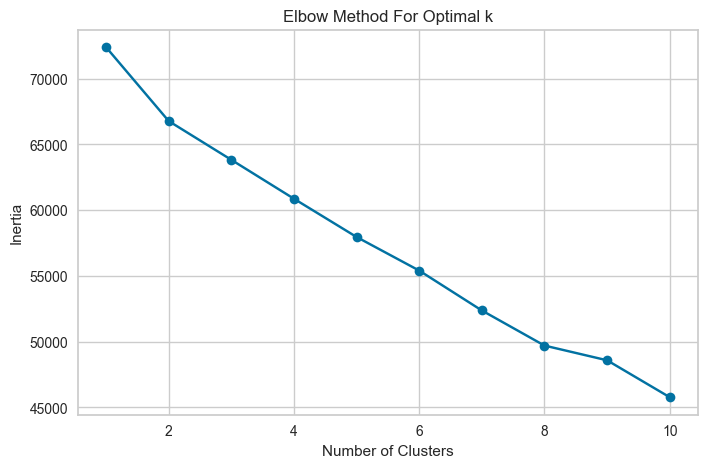

In [65]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt


# Standardize the features
scaler = StandardScaler()
df_features = df_subscribers.drop(columns=["y"])

X_scaled = scaler.fit_transform(df_features)

# Elbow method to find the optimal number of clusters
inertia = []
# Test cluster numbers from 1 to 10
K = range(1, 11)
for k in K:
    kmeans = KMeans(n_clusters=k, init="k-means++", random_state=seed)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)


# Plot the elbow curve
plt.figure(figsize=(8, 5))
plt.plot(K, inertia, "bo-")
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.title("Elbow Method For Optimal k")
plt.show()

In [42]:
# PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Convert to data frame
principal_df = pd.DataFrame(data=X_pca, columns=["PC1", "PC2"])

# Shape and preview
print(principal_df.shape)
principal_df.head()

(2896, 2)


,PC1,PC2
0,1.748747,0.840905
1,1.717571,0.578760
2,0.792063,1.465987
3,1.503057,1.163809
4,1.188262,-0.411836


In [60]:
# KMeans
kmeans = KMeans(n_clusters=4, n_init=15, max_iter=500, random_state=seed)

# Train and make predictions
clusters = kmeans.fit_predict(X_scaled)

# Cluster centers
centroids = kmeans.cluster_centers_
centroids_pca = pca.transform(centroids)

Text(0, 0.5, 'PC2')

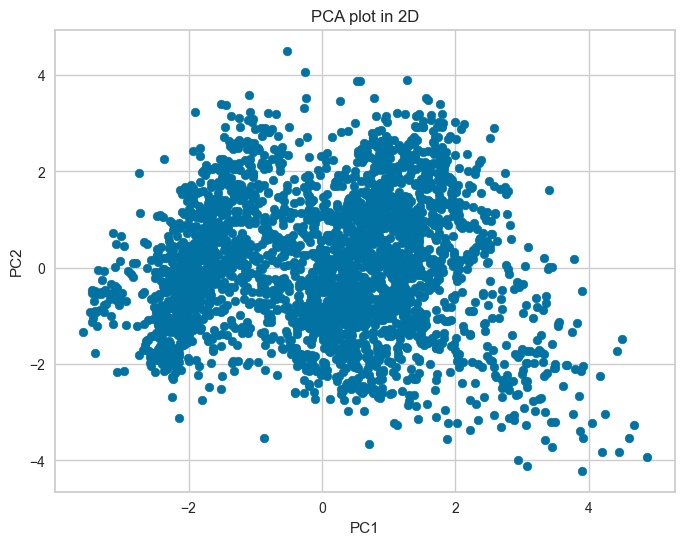

In [61]:
# Figure size
plt.figure(figsize=(8, 6))

# Scatterplot
plt.scatter(principal_df.iloc[:, 0], principal_df.iloc[:, 1], s=40)

# Aesthetics
plt.title("PCA plot in 2D")
plt.xlabel("PC1")
plt.ylabel("PC2")

Text(0, 0.5, 'PC2')

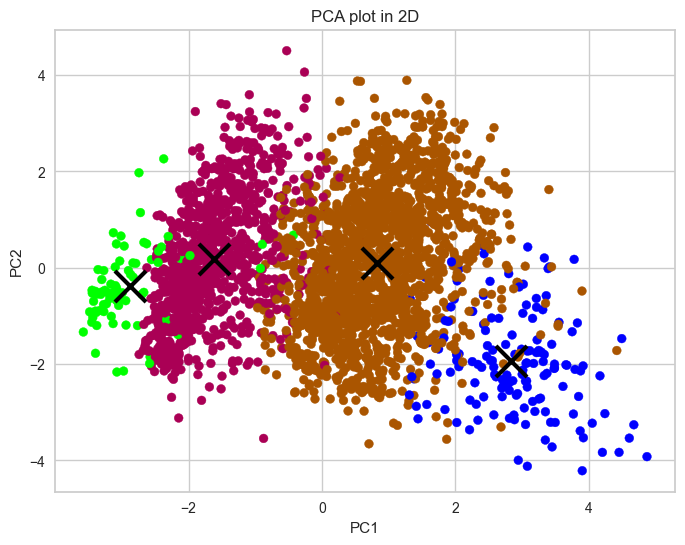

In [62]:
# Figure size
plt.figure(figsize=(8, 6))

# Scatterplot
plt.scatter(
    principal_df.iloc[:, 0], principal_df.iloc[:, 1], c=clusters, cmap="brg", s=40
)
plt.scatter(
    x=centroids_pca[:, 0],
    y=centroids_pca[:, 1],
    marker="x",
    s=500,
    linewidths=3,
    color="black",
)

# Aesthetics
plt.title("PCA plot in 2D")
plt.xlabel("PC1")
plt.ylabel("PC2")

In [63]:
# PCA
pca = PCA(n_components=3)
components = pca.fit_transform(X_scaled)

# 3D scatterplot
fig = px.scatter_3d(
    components,
    x=0,
    y=1,
    z=2,
    color=clusters,
    size=0.1 * np.ones(len(X_scaled)),
    opacity=1,
    title="PCA plot in 3D",
    labels={"0": "PC 1", "1": "PC 2", "2": "PC 3"},
    width=650,
    height=500,
)
fig.show()

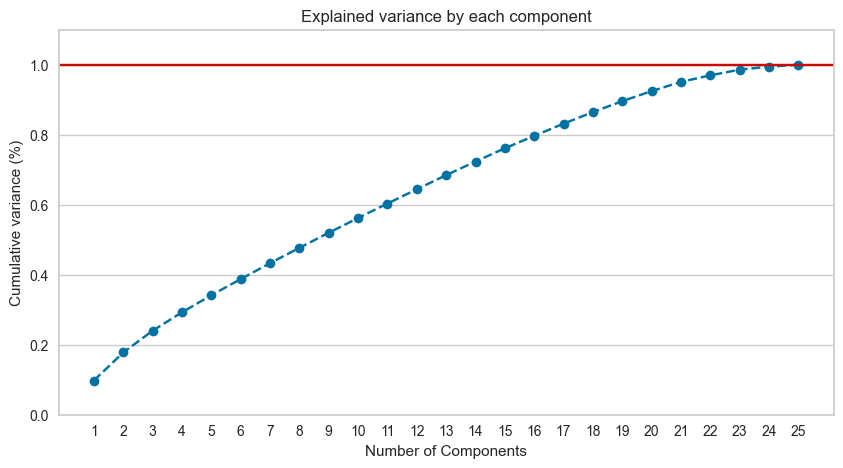

In [64]:
# PCA
pca_var = PCA()
pca_var.fit(X_scaled)

# Plot
plt.figure(figsize=(10, 5))
xi = np.arange(1, 1 + X_scaled.shape[1], step=1)
yi = np.cumsum(pca_var.explained_variance_ratio_)
plt.plot(xi, yi, marker="o", linestyle="--", color="b")

# Aesthetics
plt.ylim(0.0, 1.1)
plt.xlabel("Number of Components")
plt.xticks(np.arange(1, 1 + X_scaled.shape[1], step=1))
plt.ylabel("Cumulative variance (%)")
plt.title("Explained variance by each component")
plt.axhline(y=1, color="r", linestyle="-")
plt.gca().xaxis.grid(False)

### Visualize the Clusters

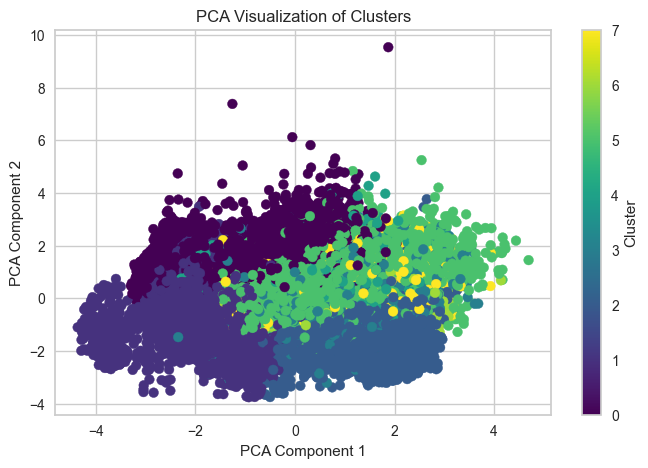

In [135]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Fit the clustering model
kmeans = KMeans(
    n_clusters=8, random_state=seed
)  # Adjust the number of clusters as needed
kmeans.fit(X_scaled)
features = df_features.columns
# Convert the scaled data back to a DataFrame
X_scaled_df = pd.DataFrame(X_scaled, columns=features)
X_scaled_df["Cluster"] = kmeans.labels_

# Visualize using PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(8, 5))
plt.scatter(
    X_pca[:, 0], X_pca[:, 1], c=X_scaled_df["Cluster"], cmap="viridis", marker="o"
)
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.title("PCA Visualization of Clusters")
plt.colorbar(label="Cluster")
plt.show()

In [136]:
# Analyze the characteristics of each cluster
for cluster in range(kmeans.n_clusters):
    print(f"Cluster {cluster}:")
    cluster_data = X_scaled_df[X_scaled_df["Cluster"] == cluster]
    print(cluster_data.describe())  # Summary statistics
    print("\n")

Cluster 0:
          age  education  default  balance  housing    loan  month_num  \
count 7871.00    7871.00  7871.00  7871.00  7871.00 7871.00    7871.00   
mean    -0.03       0.98    -0.05     0.16    -0.14   -0.11       0.19   
std      0.93       0.66     0.80     1.36     1.02    0.89       1.09   
min     -1.92      -2.67    -0.14    -1.84    -1.23   -0.46      -2.18   
25%     -0.78       1.24    -0.14    -0.41    -1.23   -0.46      -0.44   
50%     -0.26       1.24    -0.14    -0.26     0.82   -0.46      -0.00   
75%      0.67       1.24    -0.14     0.16     0.82   -0.46       0.86   
max      3.47       1.24     6.96    34.73     0.82    2.18       2.60   

          day  duration  campaign  ...  job_services  job_student  \
count 7871.00   7871.00   7871.00  ...       7871.00      7871.00   
mean     0.06     -0.02      0.05  ...         -0.33        -0.12   
std      1.00      1.01      1.06  ...          0.00         0.00   
min     -1.81     -0.98     -0.58  ...        

In [137]:
from sklearn.metrics import silhouette_score

# Calculate silhouette score
silhouette_avg = silhouette_score(X_scaled_df, X_scaled_df["Cluster"])
print(f"Silhouette Score: {silhouette_avg}")

Silhouette Score: 0.1663181110785352


In [140]:
from sklearn.cluster import FeatureAgglomeration
import pandas as pd
from sklearn.preprocessing import StandardScaler


# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_data_final)

# Test with different numbers of clusters
for n_clusters in range(2, 21):  # Adjust the range as needed
    # Apply Feature Agglomeration
    agglo = FeatureAgglomeration(n_clusters=n_clusters)
    X_reduced = agglo.fit_transform(X_scaled)

    # Print the shape of the reduced feature set
    print(f"n_clusters={n_clusters}: Reduced feature set shape: {X_reduced.shape}")

n_clusters=2: Reduced feature set shape: (40000, 2)
n_clusters=3: Reduced feature set shape: (40000, 3)
n_clusters=4: Reduced feature set shape: (40000, 4)
n_clusters=5: Reduced feature set shape: (40000, 5)
n_clusters=6: Reduced feature set shape: (40000, 6)
n_clusters=7: Reduced feature set shape: (40000, 7)
n_clusters=8: Reduced feature set shape: (40000, 8)
n_clusters=9: Reduced feature set shape: (40000, 9)
n_clusters=10: Reduced feature set shape: (40000, 10)
n_clusters=11: Reduced feature set shape: (40000, 11)
n_clusters=12: Reduced feature set shape: (40000, 12)
n_clusters=13: Reduced feature set shape: (40000, 13)
n_clusters=14: Reduced feature set shape: (40000, 14)
n_clusters=15: Reduced feature set shape: (40000, 15)
n_clusters=16: Reduced feature set shape: (40000, 16)
n_clusters=17: Reduced feature set shape: (40000, 17)
n_clusters=18: Reduced feature set shape: (40000, 18)
n_clusters=19: Reduced feature set shape: (40000, 19)
n_clusters=20: Reduced feature set shape: (4

In [125]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.preprocessing import StandardScaler

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Transpose so that each row is a feature
# Standardize features
scaler = StandardScaler()
df_features = df_data_final.drop(columns=["y"])
df_scaled = scaler.fit_transform(df_features)
df_scaled = pd.DataFrame(df_scaled, columns=df_features.columns)


df_transposed = df_scaled.transpose()

np.shape(df_transposed)

(25, 40000)

UMAP

In [126]:
# Perform hierarchical clustering on features
linked = linkage(df_transposed, method="ward", metric="euclidean")

np.shape(linked)

(24, 4)

In [128]:
df_linked = pd.DataFrame(linked, columns=["c1", "c2", "distance", "size"])
df_linked[["c1", "c2", "size"]] = df_linked[["c1", "c2", "size"]].astype("int")

df_linked.head(50)

,c1,c2,distance,size
0,1,13,208.67,2
1,0,14,230.97,2
2,4,24,256.51,2
3,17,22,258.20,2
4,7,9,258.39,2
5,10,21,264.48,2
6,3,6,268.37,2
7,2,5,272.03,2
8,12,23,277.50,2
9,8,19,280.30,2


In [129]:
df_transposed

,0,1,2,3,4,5,6,7,8,9,...,39990,39991,39992,39993,39994,39995,39996,39997,39998,39999
age,1.81,0.36,-0.78,0.67,-0.78,-0.58,-1.30,0.15,1.81,0.25,...,-1.51,-0.78,0.46,-0.89,-0.58,1.29,-1.09,1.40,-0.68,-0.26
education,1.24,-0.06,-0.06,-2.67,-2.67,1.24,1.24,1.24,-1.37,-0.06,...,-0.06,1.24,-0.06,1.24,1.24,1.24,1.24,-0.06,1.24,-0.06
default,-0.14,-0.14,-0.14,-0.14,-0.14,-0.14,-0.14,6.96,-0.14,-0.14,...,-0.14,-0.14,-0.14,-0.14,-0.14,-0.14,-0.14,-0.14,-0.14,-0.14
balance,0.30,-0.43,-0.44,0.08,-0.44,-0.36,-0.28,-0.44,-0.40,-0.23,...,-0.01,-0.00,-0.30,0.65,0.63,-0.30,0.71,-0.37,-0.08,0.06
housing,0.82,0.82,0.82,0.82,-1.23,0.82,0.82,0.82,0.82,0.82,...,0.82,0.82,0.82,-1.23,0.82,-1.23,-1.23,-1.23,-1.23,0.82
loan,-0.46,-0.46,2.18,-0.46,-0.46,-0.46,2.18,-0.46,-0.46,-0.46,...,-0.46,-0.46,-0.46,-0.46,-0.46,-0.46,-0.46,-0.46,-0.46,-0.46
month_num,-0.44,-0.44,-0.44,-0.44,-0.44,-0.44,-0.44,-0.44,-0.44,-0.44,...,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00
day,-1.33,-1.33,-1.33,-1.33,-1.33,-1.33,-1.33,-1.33,-1.33,-1.33,...,-1.57,-1.57,-1.57,-1.57,-1.57,-1.57,-1.57,-1.57,-1.57,-1.57
duration,0.02,-0.40,-0.69,-0.63,-0.22,-0.45,-0.15,0.48,-0.79,-0.77,...,0.50,7.57,-0.06,-0.50,0.82,-0.57,-0.06,-0.33,0.34,-0.55
campaign,-0.58,-0.58,-0.58,-0.58,-0.58,-0.58,-0.58,-0.58,-0.58,-0.58,...,-0.27,-0.58,-0.58,-0.58,-0.58,-0.58,0.04,-0.58,-0.58,-0.58


Text(0, 0.5, "Ward's distance")

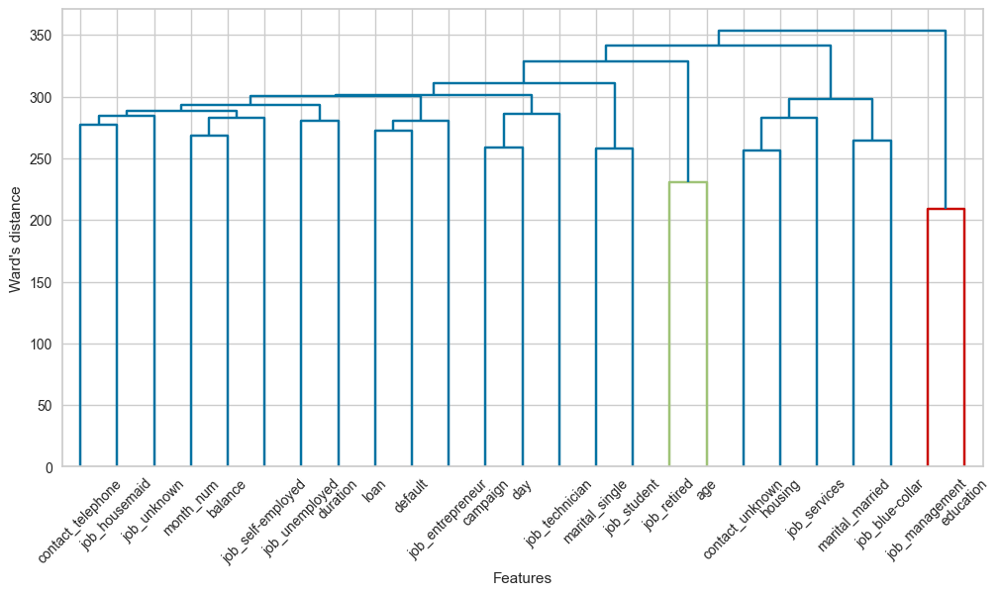

In [130]:
# Create a dendrogram to visualize the feature clustering
plt.figure(figsize=(12, 6))
dendrogram(
    linked,
    orientation="top",
    labels=df_transposed.index,
    distance_sort="descending",
    show_leaf_counts=True,
)

plt.xlabel("Features")
plt.ylabel("Ward's distance")

In [132]:
num_clusters = 2  # Adjust the number of clusters as needed

labels = fcluster(linked, t=num_clusters, criterion="maxclust")
labels

array([2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2], dtype=int32)